In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree 
from sklearn.model_selection import train_test_split

## Load the Data

In [2]:
path = r'/Users/andrenedvidek/Desktop/Data Analaysis/CareerFoundry /Specialization/Task 2.3/Data'

In [3]:
df_2 = pd.read_csv(os.path.join(path, 'answered_cleand.csv'))

In [4]:
df = pd.read_csv(os.path.join(path, 'predicted_weather_cleand.csv'))

In [5]:
df.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,...,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,KASSEL_cloud_cover,MUNCHENB_pressue,STOCKHOLM_humidity
0,19600101,1,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,...,1.0003,0.45,0.34,4.7,8.5,6.0,10.9,8,1.0304,0.98
1,19600102,1,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,...,1.0007,0.25,0.84,0.7,8.9,5.6,12.1,6,1.0292,0.62
2,19600103,1,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,...,1.0096,0.17,0.08,0.1,10.5,8.1,12.9,8,1.0320,0.69
3,19600104,1,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,...,1.0184,0.13,0.98,0.0,7.4,7.3,10.6,6,1.0443,0.98
4,19600105,1,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,...,1.0328,0.46,0.00,5.7,5.7,3.0,8.4,7,1.0430,0.96


In [6]:
df.shape

(22950, 137)

In [7]:
df.dtypes

DATE                    int64
MONTH                   int64
BASEL_cloud_cover       int64
BASEL_humidity        float64
BASEL_pressure        float64
                       ...   
VALENTIA_temp_min     float64
VALENTIA_temp_max     float64
KASSEL_cloud_cover      int64
MUNCHENB_pressue      float64
STOCKHOLM_humidity    float64
Length: 137, dtype: object

In [8]:
df_2

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22946,20221028,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22947,20221029,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22948,20221030,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [9]:
df_2.dtypes

DATE                           int64
BASEL_pleasant_weather         int64
BELGRADE_pleasant_weather      int64
BUDAPEST_pleasant_weather      int64
DEBILT_pleasant_weather        int64
DUSSELDORF_pleasant_weather    int64
HEATHROW_pleasant_weather      int64
KASSEL_pleasant_weather        int64
LJUBLJANA_pleasant_weather     int64
MAASTRICHT_pleasant_weather    int64
MADRID_pleasant_weather        int64
MUNCHENB_pleasant_weather      int64
OSLO_pleasant_weather          int64
SONNBLICK_pleasant_weather     int64
STOCKHOLM_pleasant_weather     int64
VALENTIA_pleasant_weather      int64
dtype: object

In [10]:
df_2.shape

(22950, 16)

In [11]:
answers = df_2 

In [12]:
answers

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22946,20221028,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22947,20221029,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22948,20221030,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


|1961|1962|1963|1964|1965

## Preprocess the Data

In [13]:
#Reduce your dataset to a single year
dfyear = df.loc[df['DATE'].astype(str).str[:4].isin(['1990','1991','1992','1993','1994','1995','1996','1997','1998','1999'])] #<-----INSERT YEAR HERE
dfyear

,DATE,MONTH,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,...,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,KASSEL_cloud_cover,MUNCHENB_pressue,STOCKHOLM_humidity
10958,19900101,1,0,0.83,1.0217,0.60,0.00,7.2,-2.1,-3.6,...,1.0068,0.20,0.51,2.0,6.9,4.5,9.4,8,1.0321,0.76
10959,19900102,1,2,0.84,1.0238,0.48,0.00,2.3,-1.8,-3.9,...,1.0040,0.21,1.48,0.1,7.3,4.7,9.9,8,1.0348,0.73
10960,19900103,1,8,0.89,1.0231,0.20,0.00,0.0,-2.2,-4.2,...,1.0094,0.38,0.00,4.9,7.8,4.8,10.7,8,1.0361,0.75
10961,19900104,1,2,0.77,1.0265,0.54,0.00,5.6,-0.7,-3.1,...,1.0112,0.13,0.92,0.0,6.5,2.0,11.0,2,1.0423,0.91
10962,19900105,1,7,0.81,1.0286,0.23,0.04,0.2,0.0,-3.1,...,1.0108,0.20,0.56,1.2,9.4,7.2,11.7,6,1.0413,0.90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14605,19991227,12,7,0.74,0.9953,0.28,1.93,1.0,5.0,1.5,...,0.9954,0.15,0.41,0.1,4.8,3.0,7.5,6,1.0143,0.88
14606,19991228,12,8,0.88,0.9956,0.13,1.22,0.0,2.4,1.0,...,1.0102,0.41,0.03,5.1,5.3,2.5,8.1,8,1.0029,0.88
14607,19991229,12,8,0.84,1.0162,0.21,0.11,0.1,1.8,1.0,...,1.0229,0.35,0.85,3.9,7.1,4.2,9.1,2,1.0299,0.87
14608,19991230,12,7,0.80,1.0276,0.26,0.01,0.5,1.1,-0.3,...,1.0171,0.14,0.27,0.0,8.4,5.5,11.2,6,1.0437,0.85


In [14]:
#Reduce your dataset to a single year
dfyear_answers = df_2.loc[df_2['DATE'].astype(str).str[:4].isin(['1990','1991','1992','1993','1994','1995','1996','1997','1998','1999'])] #<-----INSERT YEAR HERE
dfyear_answers

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
10958,19900101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10959,19900102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10960,19900103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10961,19900104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10962,19900105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14605,19991227,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14606,19991228,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14607,19991229,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14608,19991230,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [15]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
dfyear= dfyear.drop(['DATE','MONTH'], axis=1)

In [16]:
dfyear_answers = dfyear_answers.drop(['DATE'], axis=1)

In [17]:
dfyear.shape

(3652, 135)

In [18]:
dfyear_answers.shape

(3652, 15)

In [19]:
X = dfyear

In [20]:
Y = dfyear_answers.max(axis=1)
print("Shape Y:", Y.shape)

Shape Y: (3652,)


In [21]:
X.shape

(3652, 135)

In [22]:
Y.shape


(3652,)

In [23]:
# Split data into train and test set

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state = 42)

In [24]:
# Check shapes
print(X_train.shape, Y_train.shape)
print(X_test.shape, Y_test.shape)

(2739, 135) (2739,)
(913, 135) (913,)


## Random Forest Model

In [25]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=10)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, Y_train)

RandomForestClassifier(max_depth=10)

In [26]:
# performing predictions on the test dataset
Y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(Y_test, Y_pred))

Model Accuracy:  0.968236582694414


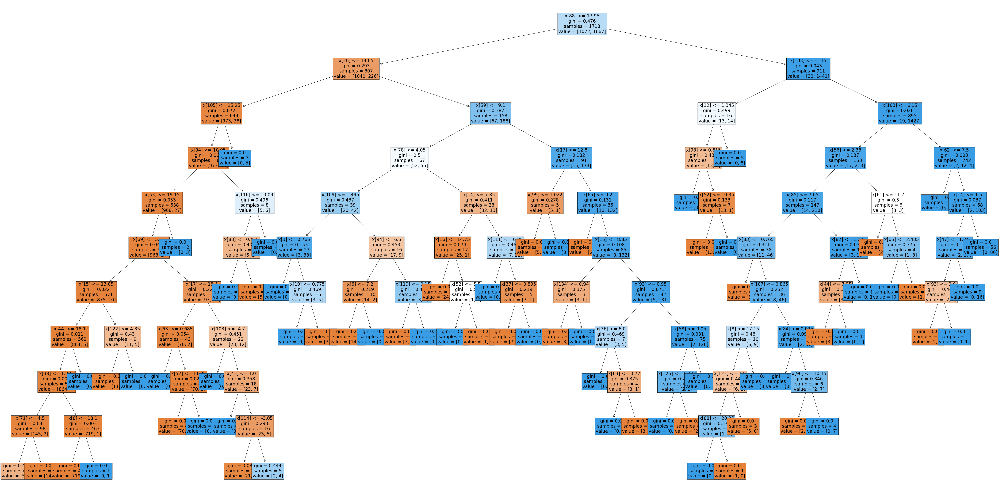

In [27]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[6], fontsize = 20, filled=True);

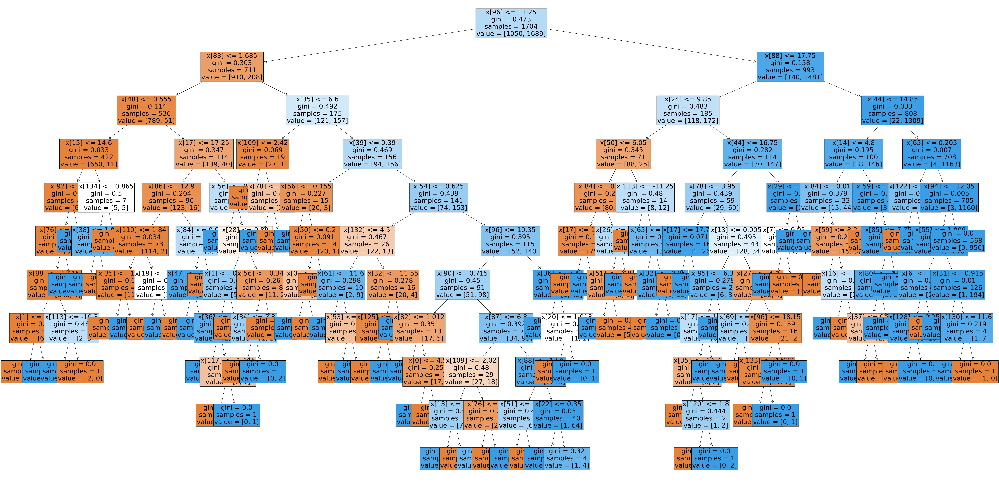

In [28]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[70], fontsize = 30, filled=True);

In [29]:
City = ['Basel',
    'Belgrade',
    'Budapest',
    'Debilt',
    'Dusseldorf',
    'Heathrow',
    'Kassel',
    'Ljubljana',
    'Maastricht',
    'Madrid',
    'Munchenb',
    'Oslo',
    'Sonnblick',
    'Stockholm',
    'Valentia'
      ]

In [30]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.00037797, 0.00159131, 0.00178981, 0.00278239, 0.00089493,
       0.00089667, 0.033663  , 0.00180088, 0.01541296, 0.00118619,
       0.00391797, 0.00099755, 0.00822698, 0.00267065, 0.00272025,
       0.00744412, 0.00890936, 0.02437661, 0.00074933, 0.00203209,
       0.00146078, 0.01008692, 0.00148726, 0.00149857, 0.06117663,
       0.00980365, 0.04209188, 0.00081786, 0.00124392, 0.00110976,
       0.00508741, 0.00069958, 0.0011969 , 0.01504328, 0.00108973,
       0.01606147, 0.00084614, 0.00116132, 0.00111783, 0.00564884,
       0.00060995, 0.00090142, 0.01770874, 0.00507809, 0.03754967,
       0.00079329, 0.00222946, 0.00093863, 0.00906979, 0.00038625,
       0.00136195, 0.00971149, 0.0013395 , 0.00754889, 0.00100761,
       0.00106757, 0.00226241, 0.00060965, 0.00091756, 0.01565914,
       0.00603106, 0.04633272, 0.00045919, 0.00225622, 0.00104492,
       0.00415049, 0.00124267, 0.00172898, 0.04063341, 0.01862835,
       0.0385211 , 0.00047996, 0.00153808, 0.00155892, 0.00137

In [31]:
np.set_printoptions(threshold=1000)

In [60]:
newarray = newarray.reshape(-1,15,9)
print(newarray.shape)
newarray

ValueError: cannot reshape array of size 9 into shape (15,9)

In [35]:
sumarray = np.sum(newarray[0], axis=1)
sumarray

array([0.05920991, 0.06044969, 0.13038711, 0.04234991, 0.070622  ,
       0.03337924, 0.07434691, 0.1086861 , 0.05393087, 0.1879039 ,
       0.0625508 , 0.03914065, 0.01529594, 0.04673725, 0.01500971])

In [36]:
important = pd.Series(sumarray, index = City) #.sort_values(ascending = False)
important

Basel         0.059210
Belgrade      0.060450
Budapest      0.130387
Debilt        0.042350
Dusseldorf    0.070622
Heathrow      0.033379
Kassel        0.074347
Ljubljana     0.108686
Maastricht    0.053931
Madrid        0.187904
Munchenb      0.062551
Oslo          0.039141
Sonnblick     0.015296
Stockholm     0.046737
Valentia      0.015010
dtype: float64

['Basel', 'Belgrade', 'Budapest', 'Debilt', 'Dusseldorf', 'Heathrow', 'Kassel', 'Ljubljana', 'Maastricht', 'Madrid', 'Munchenb', 'Oslo', 'Sonnblick', 'Stockholm', 'Valentia']


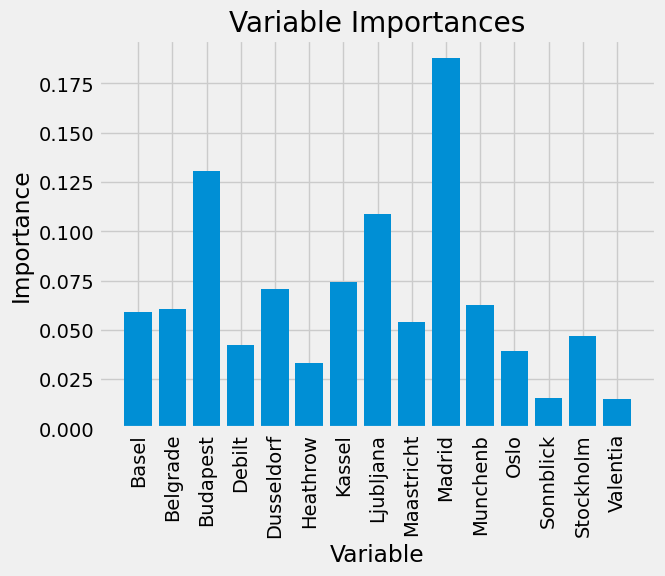

In [37]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(City)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, City, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

#### Madrid Budapest and Ljubljana have the most influence on the random forest 

## Random Tree For Just Madrid

In [38]:
column_list = df.columns.tolist()

In [39]:
column_list

['DATE',
 'MONTH',
 'BASEL_cloud_cover',
 'BASEL_humidity',
 'BASEL_pressure',
 'BASEL_global_radiation',
 'BASEL_precipitation',
 'BASEL_sunshine',
 'BASEL_temp_mean',
 'BASEL_temp_min',
 'BASEL_temp_max',
 'BELGRADE_cloud_cover',
 'BELGRADE_humidity',
 'BELGRADE_pressure',
 'BELGRADE_global_radiation',
 'BELGRADE_precipitation',
 'BELGRADE_sunshine',
 'BELGRADE_temp_mean',
 'BELGRADE_temp_min',
 'BELGRADE_temp_max',
 'BUDAPEST_cloud_cover',
 'BUDAPEST_humidity',
 'BUDAPEST_pressure',
 'BUDAPEST_global_radiation',
 'BUDAPEST_precipitation',
 'BUDAPEST_sunshine',
 'BUDAPEST_temp_mean',
 'BUDAPEST_temp_min',
 'BUDAPEST_temp_max',
 'DEBILT_cloud_cover',
 'DEBILT_humidity',
 'DEBILT_pressure',
 'DEBILT_global_radiation',
 'DEBILT_precipitation',
 'DEBILT_sunshine',
 'DEBILT_temp_mean',
 'DEBILT_temp_min',
 'DEBILT_temp_max',
 'DUSSELDORF_cloud_cover',
 'DUSSELDORF_humidity',
 'DUSSELDORF_pressure',
 'DUSSELDORF_global_radiation',
 'DUSSELDORF_precipitation',
 'DUSSELDORF_sunshine',
 'DUSS

In [40]:
df_madrid= df[['MADRID_cloud_cover',
 'MADRID_humidity',
 'MADRID_pressure',
 'MADRID_global_radiation',
 'MADRID_precipitation',
 'MADRID_sunshine',
 'MADRID_temp_mean',
 'MADRID_temp_min',
 'MADRID_temp_max',]]
df_madrid.head()

,MADRID_cloud_cover,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
0,6,0.92,1.0260,0.53,0.0,1.4,7.6,4.4,10.8
1,7,0.86,1.0254,0.46,0.0,0.9,9.8,7.4,12.2
2,5,0.90,1.0287,0.63,0.0,2.3,8.6,6.4,10.8
3,0,0.75,1.0281,1.16,0.0,8.7,10.3,4.5,16.1
4,2,0.64,1.0269,1.10,0.0,7.8,12.1,8.2,16.0


In [41]:
df_madrid.shape

(22950, 9)

In [42]:
answers_madrid = df_2[['MUNCHENB_pleasant_weather']]
answers_madrid

,MUNCHENB_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [43]:
X_2 = df_madrid

In [44]:
Y_2 = answers_madrid

In [45]:
Y_2 = answers_madrid.max(axis=1)
print("Shape Y_2:")

Shape Y_2:


In [46]:
print(X_2.shape)
print(Y_2.shape)

(22950, 9)
(22950,)


In [47]:
# Split data into train and test set

X_2_train, X_2_test, Y_2_train, Y_2_test = train_test_split(X_2,Y_2,random_state = 42)

In [48]:
# Check shapes
print(X_2_train.shape, Y_2_train.shape)
print(X_2_test.shape, Y_2_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [49]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=10)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_2_train, Y_2_train)

RandomForestClassifier(max_depth=10)

In [50]:
# performing predictions on the test dataset
Y_2_pred = clf.predict(X_2_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(Y_2_test, Y_2_pred))

Model Accuracy:  0.8089926803764378


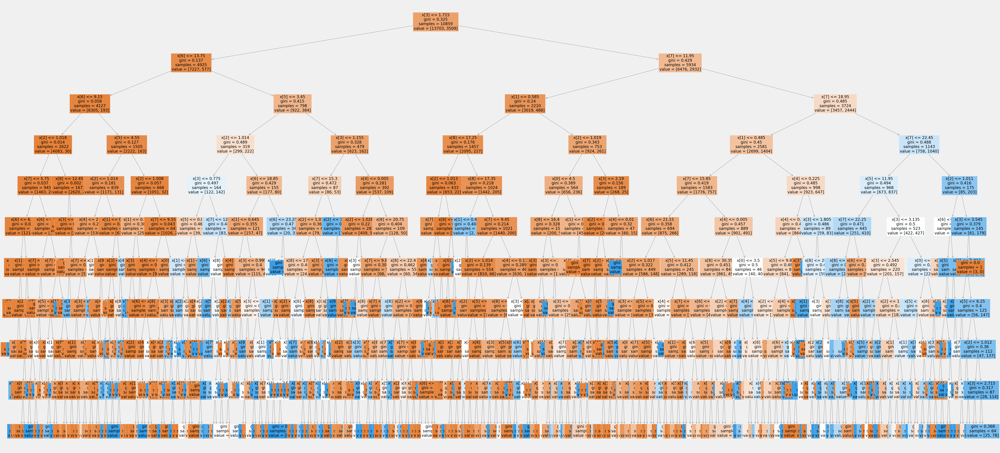

In [51]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[6], fontsize = 20, filled=True);

In [85]:
Values = ['cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max'
      ]

In [86]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.02848507, 0.06661077, 0.0978912 , 0.1038735 , 0.03931967,
       0.07039716, 0.2014268 , 0.25093018, 0.14106565])

In [87]:
np.set_printoptions(threshold=1000)

newarray = newarray.reshape(9,1)

sumarray = np.sum(newarray[0], axis=0)
sumarray

In [88]:
important = pd.Series(newarray, index = Values) #.sort_values(ascending = False)
important

cloud_cover         0.028485
humidity            0.066611
pressure            0.097891
global_radiation    0.103873
precipitation       0.039320
sunshine            0.070397
temp_mean           0.201427
temp_min            0.250930
temp_max            0.141066
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


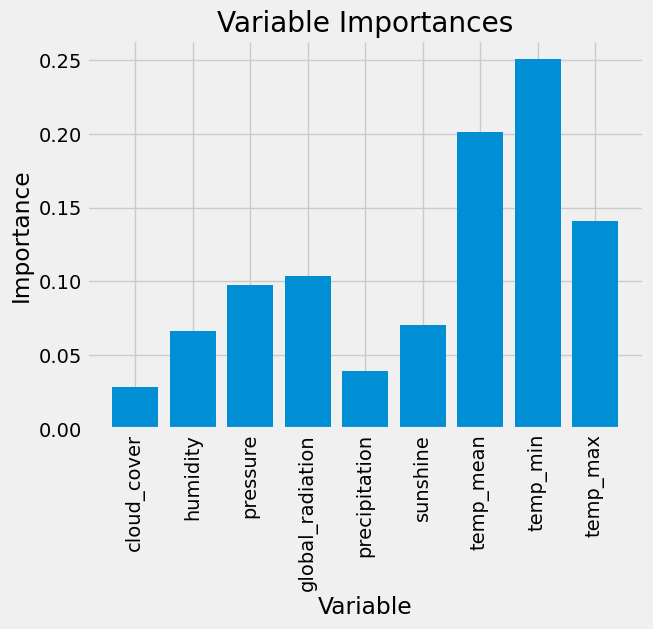

In [89]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(Values)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, Values, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

## Random Tree For Just Budapest

In [90]:
df_budapest= df[['BUDAPEST_cloud_cover',
 'BUDAPEST_humidity',
 'BUDAPEST_pressure',
 'BUDAPEST_global_radiation',
 'BUDAPEST_precipitation',
 'BUDAPEST_sunshine',
 'BUDAPEST_temp_mean',
 'BUDAPEST_temp_min',
 'BUDAPEST_temp_max',]]
df_budapest.head()

,BUDAPEST_cloud_cover,BUDAPEST_humidity,BUDAPEST_pressure,BUDAPEST_global_radiation,BUDAPEST_precipitation,BUDAPEST_sunshine,BUDAPEST_temp_mean,BUDAPEST_temp_min,BUDAPEST_temp_max
0,4,0.67,1.017,0.44,0.01,2.3,2.4,-0.4,5.1
1,4,0.67,1.017,0.18,0.31,0.0,2.3,1.4,3.1
2,4,0.67,1.017,0.30,0.00,0.6,2.7,1.7,5.3
3,4,0.67,1.017,0.19,0.00,0.0,2.0,0.4,4.4
4,4,0.67,1.017,0.19,0.00,0.0,2.5,1.1,5.3


In [91]:
df_budapest.shape

(22950, 9)

In [92]:
answers_budapest = df_2[['BUDAPEST_pleasant_weather']]
answers_budapest

,BUDAPEST_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [93]:
X_3 = df_budapest

In [94]:
Y_3 = answers_budapest

In [95]:
Y_3 = answers_budapest.max(axis=1)
print("Shape Y_3:")

Shape Y_3:


In [96]:
print(X_3.shape)
print(Y_3.shape)

(22950, 9)
(22950,)


In [97]:
# Split data into train and test set

X_3_train, X_3_test, Y_3_train, Y_3_test = train_test_split(X_3,Y_3,random_state = 42)

In [98]:
# Check shapes
print(X_3_train.shape, Y_3_train.shape)
print(X_3_test.shape, Y_3_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [99]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=10)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_3_train, Y_3_train)

RandomForestClassifier(max_depth=10)

In [100]:
# performing predictions on the test dataset
Y_3_pred = clf.predict(X_3_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(Y_3_test, Y_3_pred))

Model Accuracy:  1.0


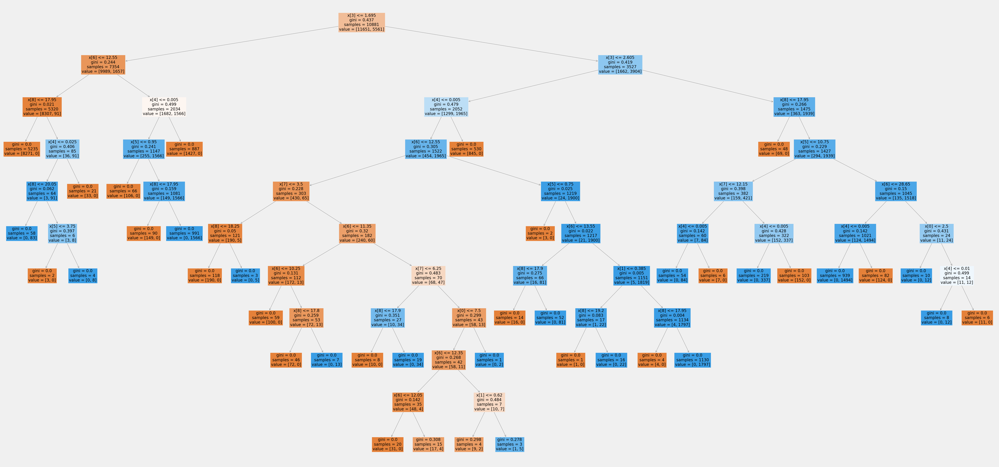

In [101]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[6], fontsize = 20, filled=True);

In [102]:
Values = ['cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max'
      ]

In [103]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.01499807, 0.00393536, 0.00372771, 0.07282719, 0.34728182,
       0.0550061 , 0.1343897 , 0.07519881, 0.29263524])

In [104]:
np.set_printoptions(threshold=1000)

In [105]:
important = pd.Series(newarray, index = Values) #.sort_values(ascending = False)
important

cloud_cover         0.014998
humidity            0.003935
pressure            0.003728
global_radiation    0.072827
precipitation       0.347282
sunshine            0.055006
temp_mean           0.134390
temp_min            0.075199
temp_max            0.292635
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


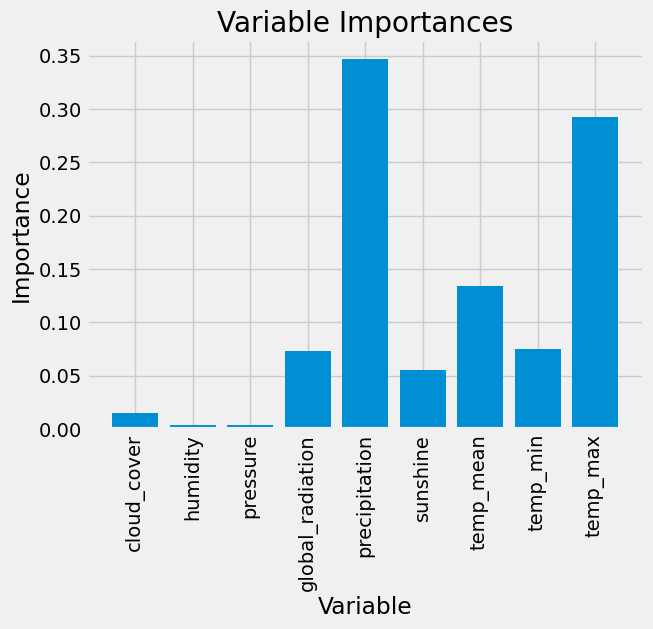

In [106]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(Values)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, Values, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

## Random Tree For Just Ljubljana

In [108]:
df_ljubljana= df[['LJUBLJANA_cloud_cover',
 'LJUBLJANA_humidity',
 'LJUBLJANA_pressure',
 'LJUBLJANA_global_radiation',
 'LJUBLJANA_precipitation',
 'LJUBLJANA_sunshine',
 'LJUBLJANA_temp_mean',
 'LJUBLJANA_temp_min',
 'LJUBLJANA_temp_max',]]
df_ljubljana.head()

,LJUBLJANA_cloud_cover,LJUBLJANA_humidity,LJUBLJANA_pressure,LJUBLJANA_global_radiation,LJUBLJANA_precipitation,LJUBLJANA_sunshine,LJUBLJANA_temp_mean,LJUBLJANA_temp_min,LJUBLJANA_temp_max
0,8,1.00,1.0173,0.20,0.00,0.0,-0.6,-1.9,0.5
1,6,0.94,1.0173,0.56,0.13,3.2,2.1,-1.3,5.5
2,8,0.96,1.0173,0.20,0.12,0.0,4.6,0.9,6.3
3,6,0.94,1.0173,0.49,0.00,2.2,3.2,1.0,7.0
4,7,0.94,1.0173,0.20,0.00,0.0,3.6,0.4,4.8


In [109]:
df_ljubljana.shape

(22950, 9)

In [110]:
answers_ljubljana = df_2[['LJUBLJANA_pleasant_weather']]
answers_ljubljana

,LJUBLJANA_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [111]:
X_4 = df_ljubljana

In [112]:
Y_4 = answers_ljubljana

In [113]:
Y_4 = answers_budapest.max(axis=1)
print("Shape Y_4:")

Shape Y_4:


In [114]:
print(X_4.shape)
print(Y_4.shape)

(22950, 9)
(22950,)


In [115]:
# Split data into train and test set

X_4_train, X_4_test, Y_4_train, Y_4_test = train_test_split(X_4,Y_4,random_state = 42)

In [116]:
# Check shapes
print(X_4_train.shape, Y_4_train.shape)
print(X_4_test.shape, Y_4_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [117]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=10)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_4_train, Y_4_train)

RandomForestClassifier(max_depth=10)

In [118]:
# performing predictions on the test dataset
Y_4_pred = clf.predict(X_4_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(Y_4_test, Y_4_pred))

Model Accuracy:  0.8443708609271523


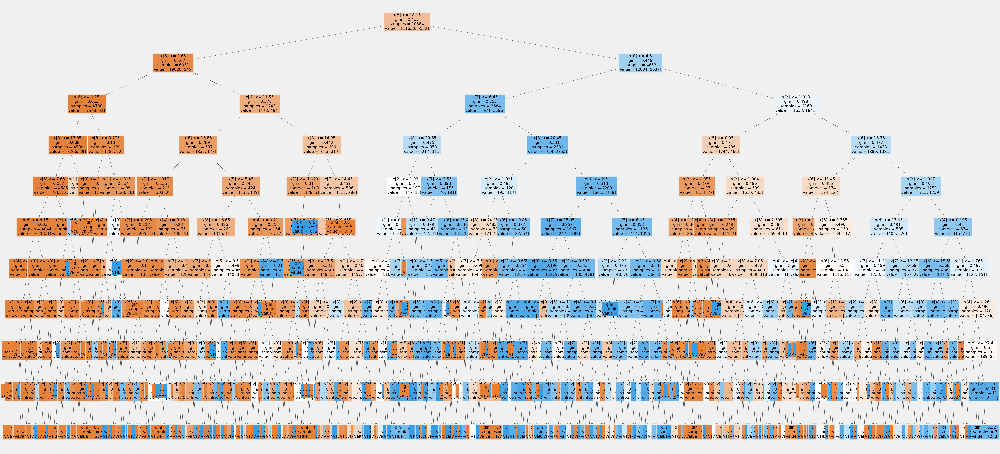

In [119]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[6], fontsize = 20, filled=True);

In [120]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.03524577, 0.0305953 , 0.05041171, 0.07593427, 0.0587944 ,
       0.05609848, 0.25835452, 0.13810148, 0.29646407])

In [121]:
np.set_printoptions(threshold=1000)

In [122]:
important = pd.Series(newarray, index = Values) #.sort_values(ascending = False)
important

cloud_cover         0.035246
humidity            0.030595
pressure            0.050412
global_radiation    0.075934
precipitation       0.058794
sunshine            0.056098
temp_mean           0.258355
temp_min            0.138101
temp_max            0.296464
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


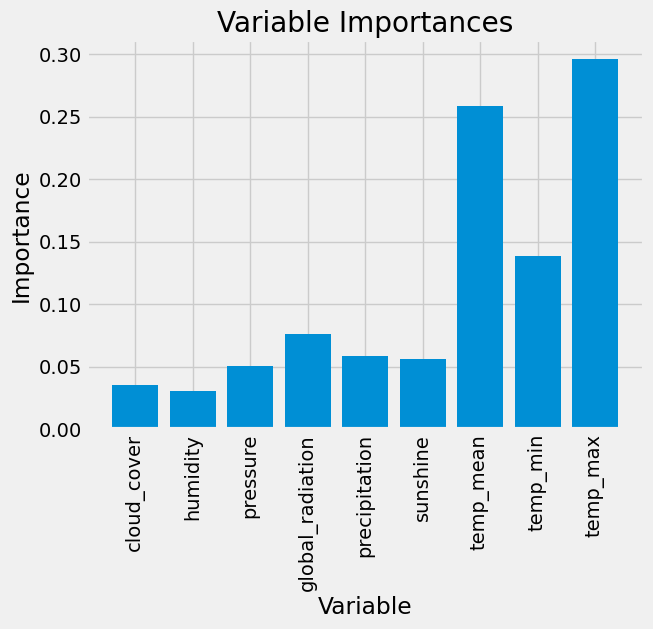

In [123]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(Values)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, Values, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');